<a href="https://colab.research.google.com/github/KeerthanaRallabhandi/KeerthanaRallabhandi/blob/main/Image_Classifier_102.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import Necessary Libraries and Module
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
# Import TensorFlow 
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

# Ignore some warnings that are not relevant (you can remove this if you prefer)
import warnings
warnings.filterwarnings('ignore')

In [3]:
# TODO: Load the dataset with TensorFlow Datasets. Hint: use tfds.load()
dataset, dataset_info = tfds.load('oxford_flowers102', as_supervised = True, with_info = True)

# Display the dataset as a dictionary
print('The dataset type:', type(dataset))

# Display the dataset's keys 
print('The keys of the dataset:', list(dataset.keys()))

# TODO: Create a training set, a validation set and a test set.
training_set = dataset['train']  
validation_set = dataset['validation']
testing_set = dataset['test']

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteGTTG39/oxford_flowers102-train.tfrecord


  0%|          | 0/1020 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteGTTG39/oxford_flowers102-test.tfrecord


  0%|          | 0/6149 [00:00<?, ? examples/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/oxford_flowers102/2.1.1.incompleteGTTG39/oxford_flowers102-validation.tfrecord


  0%|          | 0/1020 [00:00<?, ? examples/s]

Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.
The dataset type: <class 'dict'>
The keys of the dataset: ['test', 'train', 'validation']


In [4]:
dataset_info

tfds.core.DatasetInfo(
    name='oxford_flowers102',
    version=2.1.1,
    description='The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly occurring
in the United Kingdom. Each class consists of between 40 and 258 images. The images have
large scale, pose and light variations. In addition, there are categories that have large
variations within the category and several very similar categories.

The dataset is divided into a training set, a validation set and a test set.
The training set and validation set each consist of 10 images per class (totalling 1020 images each).
The test set consists of the remaining 6149 images (minimum 20 per class).',
    homepage='https://www.robots.ox.ac.uk/~vgg/data/flowers/102/',
    features=FeaturesDict({
        'file_name': Text(shape=(), dtype=tf.string),
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=102),
    }),
    total_num_examples=8

## Explore the Dataset

In [5]:
#number of examples in each set from the dataset info.
num_training_examples = dataset_info.splits['train'].num_examples
num_validation_examples = dataset_info.splits['validation'].num_examples
num_testing_examples = dataset_info.splits['test'].num_examples

#number of training set, testing set and validation set examples
print("The number of the training set examples: {}".format(num_training_examples))
print("The number of the validation set examples: {}".format(num_validation_examples))
print("The number of the testing set examples: {}".format(num_testing_examples))

#number of classes in the dataset from the dataset info.
num_classes = dataset_info.features['label'].num_classes

#number of the dataset classes
print("The number of classes in the dataset: {}".format(num_classes))

The number of the training set examples: 1020
The number of the validation set examples: 1020
The number of the testing set examples: 6149
The number of classes in the dataset: 102


In [27]:
#shape and corresponding label of 3 images in the training set.
img_counter = 1
for image, label in training_set.take(3):
    print('image ', img_counter,':')
    
    img_shape = image.shape
    print('\u2022 shape:', img_shape)
    
    img_label = label.numpy()
    print('\u2022 label:', img_label) 

    img_counter+=1


image  1 :
• shape: (500, 667, 3)
• label: 72
image  2 :
• shape: (500, 666, 3)
• label: 84
image  3 :
• shape: (670, 500, 3)
• label: 70


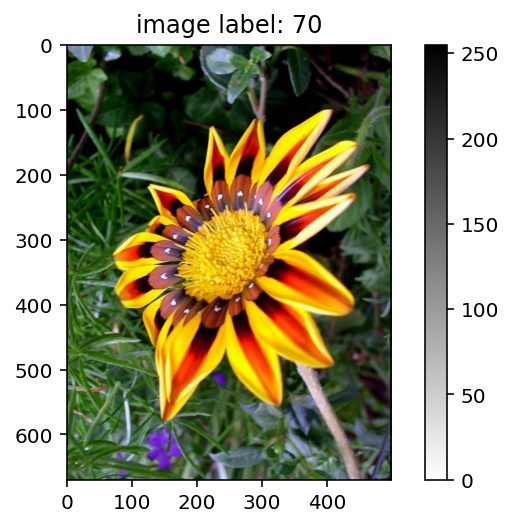

In [28]:
#Plot 1 image from the training set. 
for image, label in training_set.take(3):
    image = image.numpy().squeeze()
    img_label = label.numpy()
    
# Set the title of the plot to the corresponding image label. 
#plt.imshow(image)
plt.imshow(image, cmap = plt.cm.binary)
plt.title("image label: {}".format(img_label))
plt.colorbar()
plt.axis('on')
plt.show()

## Label map



In [6]:
with open('label_map.json', 'r') as f:
    class_names = json.load(f)

print(class_names)

{'21': 'fire lily', '3': 'canterbury bells', '45': 'bolero deep blue', '1': 'pink primrose', '34': 'mexican aster', '27': 'prince of wales feathers', '7': 'moon orchid', '16': 'globe-flower', '25': 'grape hyacinth', '26': 'corn poppy', '79': 'toad lily', '39': 'siam tulip', '24': 'red ginger', '67': 'spring crocus', '35': 'alpine sea holly', '32': 'garden phlox', '10': 'globe thistle', '6': 'tiger lily', '93': 'ball moss', '33': 'love in the mist', '9': 'monkshood', '102': 'blackberry lily', '14': 'spear thistle', '19': 'balloon flower', '100': 'blanket flower', '13': 'king protea', '49': 'oxeye daisy', '15': 'yellow iris', '61': 'cautleya spicata', '31': 'carnation', '64': 'silverbush', '68': 'bearded iris', '63': 'black-eyed susan', '69': 'windflower', '62': 'japanese anemone', '20': 'giant white arum lily', '38': 'great masterwort', '4': 'sweet pea', '86': 'tree mallow', '101': 'trumpet creeper', '42': 'daffodil', '22': 'pincushion flower', '2': 'hard-leaved pocket orchid', '54': 's

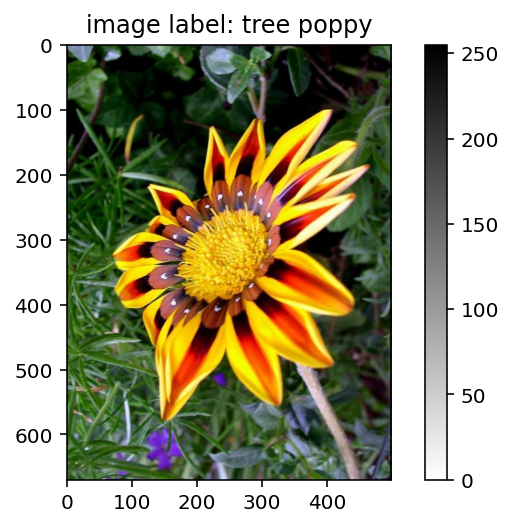

In [31]:
#Plot 1 image from the training set. Set the title of the plot to the corresponding class name. 

for image, label in training_set.take(3):
    image = image.numpy().squeeze()
    img_class = str(label.numpy())

plt.imshow(image, cmap = plt.cm.binary)
plt.title("image label: {}".format(class_names[img_class]))
plt.colorbar()
plt.axis('on')
plt.show()

## Creating Model Pipeline

In [7]:
#Create a pipeline for each set.
image_size = 224
batch_size = 64

def normalize(image, label):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (image_size, image_size))
    image /= 255
    return image, label


training_batches = training_set.shuffle(num_training_examples//4).map(normalize).batch(batch_size).prefetch(1)
validation_batches = validation_set.map(normalize).batch(batch_size).prefetch(1)
testing_batches = testing_set.map(normalize).batch(batch_size).prefetch(1)

for image_batch, label_batch in training_batches.take(1):
    print('Shape of the training image batches:{}'.format(image_batch.shape))
    print('Shape of the training label batches: {}'.format(label_batch.shape))


Shape of the training image batches:(64, 224, 224, 3)
Shape of the training label batches: (64,)


In [33]:
#Build and train network.
  
# Load the MobileNet from TensorFlow Hub
MobileNet_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"
feature_extractor = hub.KerasLayer(MobileNet_url, input_shape=(image_size, image_size, 3))
# freezing the weights and bias of the network
feature_extractor.trainable = False


In [34]:
# Adding output Layer 
model = tf.keras.Sequential([feature_extractor,
                            tf.keras.layers.Dense(num_classes, activation='softmax')])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 102)               130662    
                                                                 
Total params: 2,388,646
Trainable params: 130,662
Non-trainable params: 2,257,984
_________________________________________________________________


In [35]:
# Training the network

model.compile(
    optimizer= 'adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS = 20

history = model.fit(training_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/20
16/16 [==============================] - 20s 375ms/step - loss: 4.4082 - accuracy: 0.0814 - val_loss: 3.5812 - val_accuracy: 0.2549
Epoch 2/20
16/16 [==============================] - 6s 389ms/step - loss: 2.7460 - accuracy: 0.5412 - val_loss: 2.5944 - val_accuracy: 0.5265
Epoch 3/20
16/16 [==============================] - 6s 332ms/step - loss: 1.7219 - accuracy: 0.8245 - val_loss: 1.9901 - val_accuracy: 0.6529
Epoch 4/20
16/16 [==============================] - 5s 329ms/step - loss: 1.1182 - accuracy: 0.9186 - val_loss: 1.6419 - val_accuracy: 0.7078
Epoch 5/20
16/16 [==============================] - 5s 329ms/step - loss: 0.7820 - accuracy: 0.9529 - val_loss: 1.4263 - val_accuracy: 0.7500
Epoch 6/20
16/16 [==============================] - 6s 331ms/step - loss: 0.5694 - accuracy: 0.9804 - val_loss: 1.2885 - val_accuracy: 0.7637
Epoch 7/20
16/16 [==============================] - 6s 329ms/step - loss: 0.4362 - accuracy: 0.9824 - val_loss: 1.1917 - val_accuracy: 0.7755
Epoch

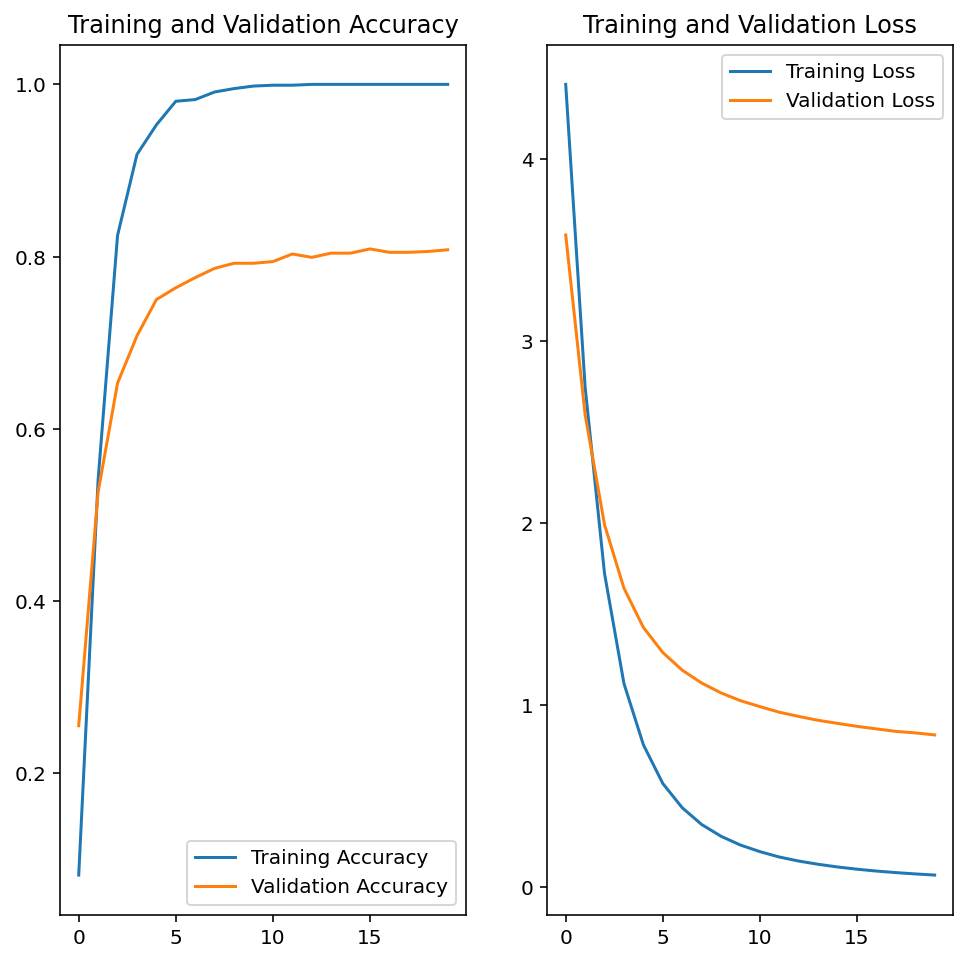

In [36]:
#Plot the loss and accuracy values achieved during training for the training and validation set.
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

training_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_accuracy, label ='Training Accuracy')
plt.plot(epochs_range, validation_accuracy, label ='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, training_loss, label ='Training Loss')
plt.plot(epochs_range, validation_loss, label ='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Testing the trained model over validation and test set

In [37]:
# TODO: Print the loss and accuracy values achieved on the entire test set.

loss, accuracy = model.evaluate(validation_batches)

print('The loss value achieved on the test dataset: {:,.3f}'.format(loss))
print('The accuracy value achieved on the test dataset: {:.3%}'.format(accuracy))

16/16 [==============================] - 3s 170ms/step - loss: 0.8360 - accuracy: 0.8078
The loss value achieved on the test dataset: 0.836
The accuracy value achieved on the test dataset: 80.784%


In [41]:
loss_test, accuracy_test = model.evaluate(testing_batches)

print('The loss value achieved on the test dataset: {:,.3f}'.format(loss_test))
print('The accuracy value achieved on the test dataset: {:.3%}'.format(accuracy_test))

97/97 [==============================] - 19s 194ms/step - loss: 0.9565 - accuracy: 0.7718
The loss value achieved on the test dataset: 0.956
The accuracy value achieved on the test dataset: 77.183%


## Save the Model.

In [42]:
# TODO: Save your trained model as a Keras model.

saved_keras_model_path = "saved_keras_model.h5"

model.save(saved_keras_model_path)

#tf.keras.experimental.export_saved_model(model, saved_keras_model_path)

## Load the saved Keras Model

In [9]:
saved_model_path = '/content/saved_keras_model_best.h5'

In [10]:
#Load the Keras model

loaded_keras_model = tf.keras.models.load_model(saved_model_path, custom_objects = {'KerasLayer':hub.KerasLayer})

loaded_keras_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 102)               130662    
                                                                 
Total params: 2,388,646
Trainable params: 130,662
Non-trainable params: 2,257,984
_________________________________________________________________


Creating list of class number and names from Label map

In [72]:
keys = []
values = []

items = class_names.items()
for item in items:
  keys.append(item[0]), values.append(item[1])

# printing keys and values separately
print("Labels : ", str(keys))
print("Classes : ", str(values))

Labels :  ['21', '3', '45', '1', '34', '27', '7', '16', '25', '26', '79', '39', '24', '67', '35', '32', '10', '6', '93', '33', '9', '102', '14', '19', '100', '13', '49', '15', '61', '31', '64', '68', '63', '69', '62', '20', '38', '4', '86', '101', '42', '22', '2', '54', '66', '70', '85', '99', '87', '5', '92', '28', '97', '57', '40', '47', '59', '48', '55', '36', '91', '29', '71', '90', '18', '98', '8', '30', '17', '52', '84', '12', '11', '96', '23', '50', '44', '53', '72', '65', '80', '76', '37', '56', '60', '82', '58', '75', '41', '95', '43', '83', '78', '88', '94', '81', '74', '89', '73', '46', '77', '51']
Classes :  ['fire lily', 'canterbury bells', 'bolero deep blue', 'pink primrose', 'mexican aster', 'prince of wales feathers', 'moon orchid', 'globe-flower', 'grape hyacinth', 'corn poppy', 'toad lily', 'siam tulip', 'red ginger', 'spring crocus', 'alpine sea holly', 'garden phlox', 'globe thistle', 'tiger lily', 'ball moss', 'love in the mist', 'monkshood', 'blackberry lily', 'sp

In [73]:
Labels = np.array(keys, dtype = int)
Labels = np.array(sorted(Labels), dtype = str)
Classes = np.array(values)

Model Prediction on the validation set

In [ ]:
image_batch, label_batch = next(iter(validation_batches))


image_batch = image_batch.numpy()
label_batch = label_batch.numpy()

predicted_batch = loaded_keras_model.predict(image_batch)
predicted_batch = tf.squeeze(predicted_batch).numpy()

predicted_ids = np.argmax(predicted_batch, axis=-1)
predicted_class_names = Labels[predicted_ids]
print(predicted_class_names)
predicted_output_class_names = Classes[predicted_ids]
print(predicted_output_class_names)

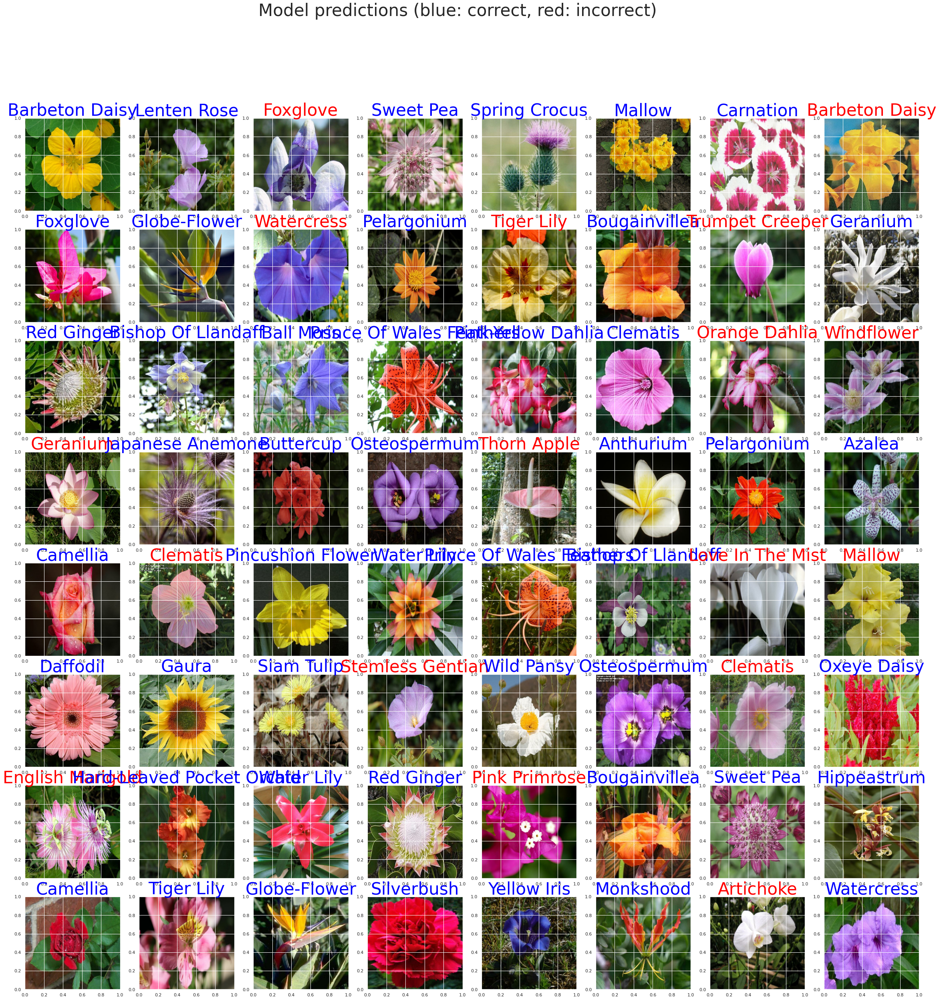

In [74]:
plt.figure(figsize=(40,40))
for n in range(batch_size):
  plt.subplot(8,8,n+1)
  plt.imshow(image_batch[n], aspect='auto', extent=plt.axis())
  color = "blue" if predicted_ids[n] == label_batch[n] else "red"
  plt.title(predicted_output_class_names[n].title(), color=color,size=42)
  plt.axis('on')
  plt.suptitle("Model predictions (blue: correct, red: incorrect)",size=42)

In [ ]:
class_ = {}
items = class_names.items()
for item in items:
  class_[int(item[0])] = item[1]

In [25]:
y_pred = loaded_keras_model.predict(validation_batches, batch_size=batch_size)
print(y_pred)

[[1.49724656e-03 9.93961876e-05 1.75374196e-04 ... 4.46025410e-07
  1.40572971e-04 3.39232465e-05]
 [6.49847928e-03 3.12167744e-04 1.36729255e-02 ... 3.70259426e-04
  8.63763038e-04 1.10336416e-03]
 [3.48389694e-05 1.13617425e-04 6.64295331e-02 ... 6.62936941e-07
  2.53871229e-04 4.36644514e-05]
 ...
 [5.86077877e-05 1.45297614e-04 1.27190317e-04 ... 5.58393949e-04
  6.92533853e-04 1.76509586e-03]
 [6.22093386e-04 1.75428995e-05 2.25701697e-05 ... 2.22806193e-07
  5.96991777e-06 1.42441638e-06]
 [3.64957959e-04 1.09834746e-05 7.37698108e-04 ... 2.84587536e-08
  1.31355802e-04 5.92345123e-06]]


In [53]:
predicted_categories = np.argmax(y_pred, axis = 1)
predicted_categories = pd.Series(predicted_categories, dtype = object)
predicted_categories.map(class_)

0       88
1       54
2       94
3       37
4       13
        ..
1015    91
1016    87
1017    84
1018    63
1019    43
Length: 1020, dtype: object

In [52]:
true_categories = tf.concat([y for x, y in validation_batches], axis = 0).numpy()
true_categories = pd.Series(true_categories, dtype = object)
true_categories.map(class_)

0       88
1       54
2        8
3       37
4       13
        ..
1015    26
1016    86
1017    98
1018    63
1019    43
Length: 1020, dtype: object

In [58]:
true_cat = np.array(true_categories,dtype = int)
pred_cat = np.array(predicted_categories,dtype = int)

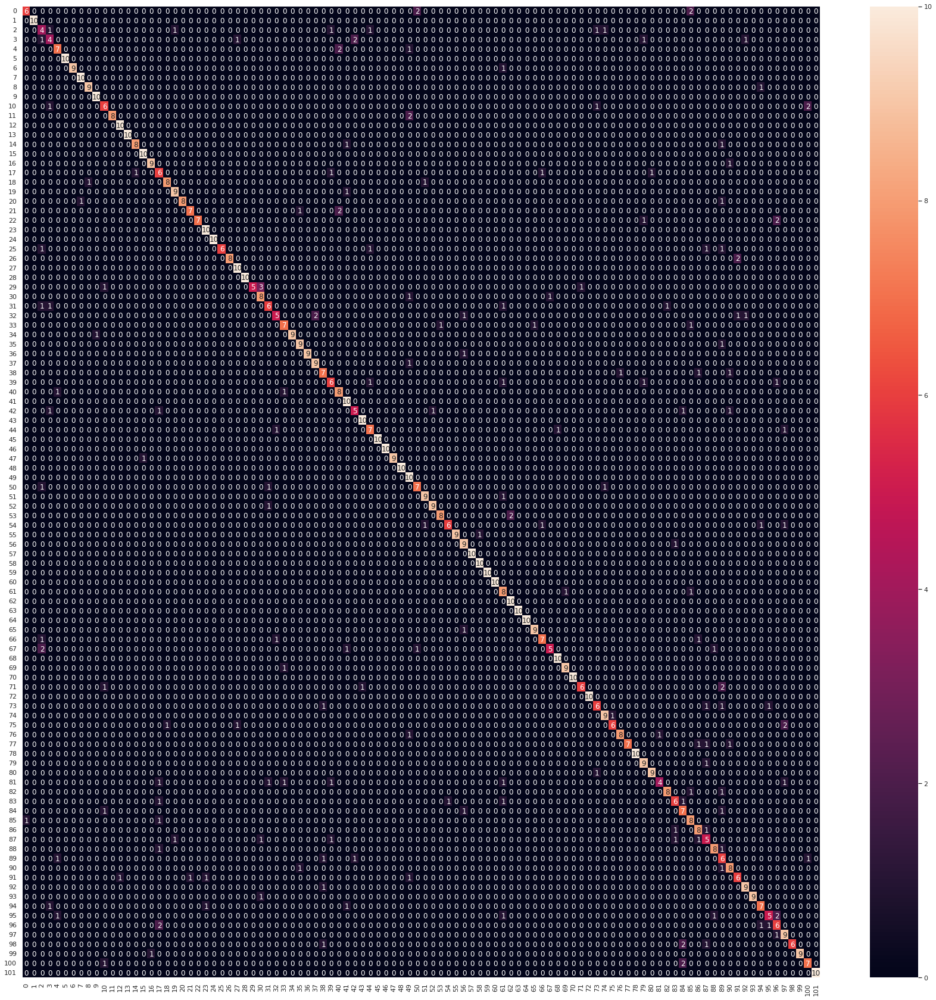

In [64]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt     

cm = confusion_matrix(true_cat,pred_cat)

plt.figure(figsize = (30,30))
sns.heatmap(cm, annot=True, fmt='g')

In [28]:
from sklearn.metrics import classification_report
print(classification_report(true_categories, predicted_categories))

              precision    recall  f1-score   support

           0       0.86      0.60      0.71        10
           1       1.00      1.00      1.00        10
           2       0.36      0.40      0.38        10
           3       0.44      0.40      0.42        10
           4       0.70      0.70      0.70        10
           5       1.00      1.00      1.00        10
           6       1.00      0.90      0.95        10
           7       0.91      1.00      0.95        10
           8       0.90      0.90      0.90        10
           9       0.91      1.00      0.95        10
          10       0.60      0.60      0.60        10
          11       1.00      0.80      0.89        10
          12       0.91      1.00      0.95        10
          13       1.00      1.00      1.00        10
          14       0.89      0.80      0.84        10
          15       0.91      1.00      0.95        10
          16       0.90      0.90      0.90        10
          17       0.46    

Inference on Test Data

In [29]:
def process_image(image):
    image = tf.convert_to_tensor(image, dtype=tf.float32)
    image = tf.image.resize(image, (image_size, image_size))
    image /= 255
    return image.numpy()

In [65]:
!unzip '/content/Test'

Archive:  /content/1.zip
  inflating: 1/image_06739.jpg       
  inflating: 1/image_06749.jpg       
  inflating: 1/image_06755.jpg       
  inflating: 1/image_06756.jpg       
  inflating: 1/image_06758.jpg       
  inflating: 1/image_06763.jpg       
  inflating: 1/image_06765.jpg       
  inflating: 1/image_06769.jpg       


In [70]:
from PIL import Image
import glob

def predict(image_path, model, top_k):
    image = Image.open(image_path)
    image = np.asarray(image)
    processed_image = process_image(image)
    expanded_image = np.expand_dims(processed_image, axis=0)
    
    model_prediction = model.predict(expanded_image)
     
    top_k_probs, top_k_classes = tf.nn.top_k(model_prediction, k=top_k)
    top_k_probs = list(top_k_probs.numpy()[0])
    top_k_classes = list(top_k_classes.numpy()[0])
     
    return top_k_probs, top_k_classes, processed_image 

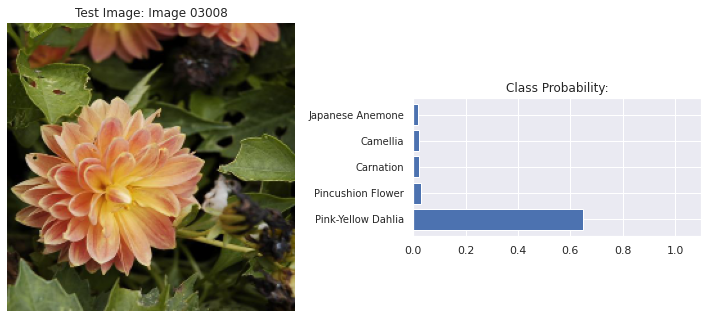

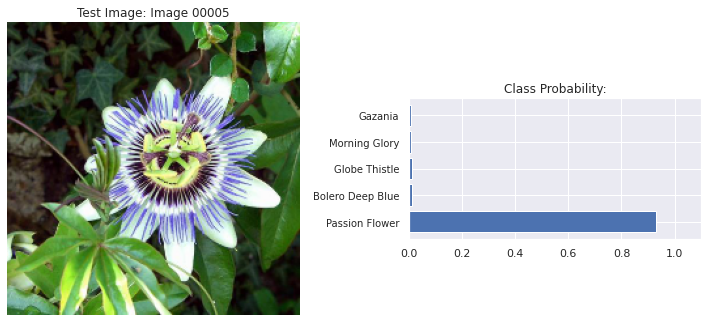

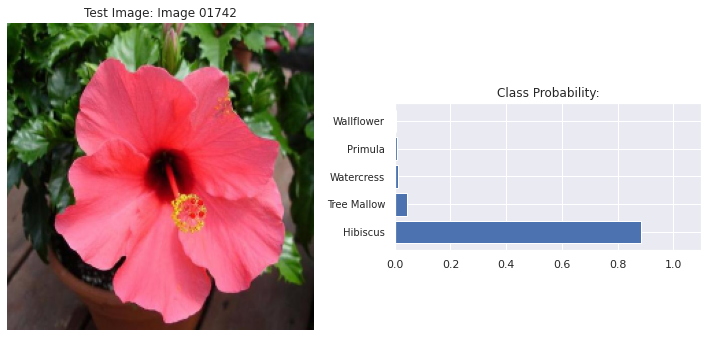

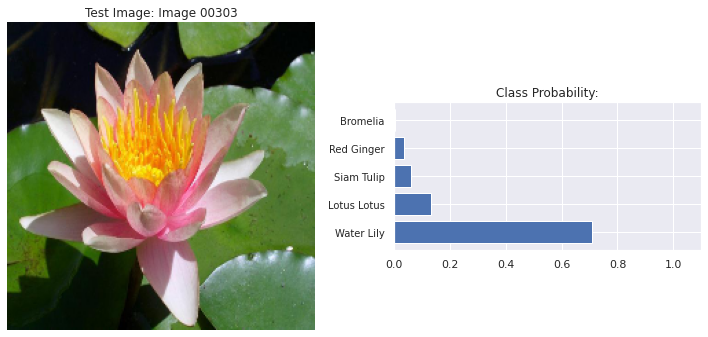

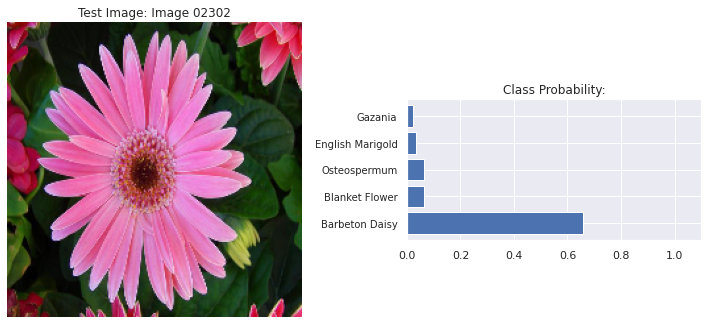

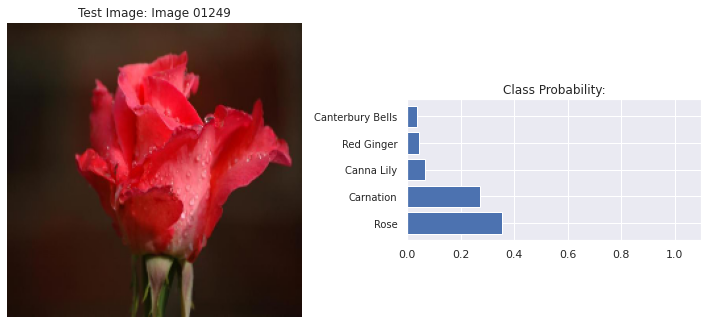

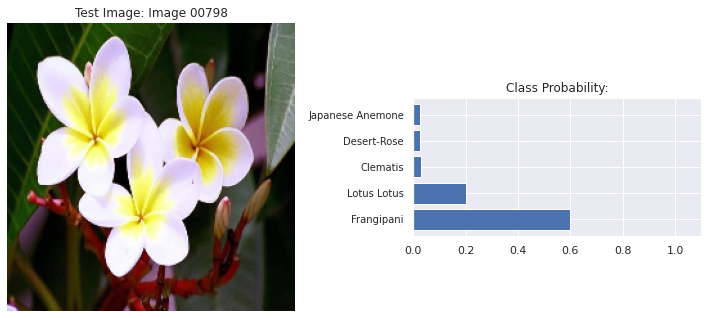

In [78]:
#for img in testing_set.take(3):
for img_path in glob.glob('/content/Test/*.jpg'):
    img = img_path[14:-4].title().replace('_', ' ')

    top_k_probs, top_k_classes, processed_image = predict(img_path, loaded_keras_model, 5)
    
    top_k_class_names = []
    for lable in top_k_classes:
        top_k_class_names.append(class_names[str(lable+1)].title())
        

    fig, (ax1, ax2) = plt.subplots(figsize=(10,10), ncols=2)
    ax1.imshow(processed_image)
    ax1.axis('off')
    ax1.set_title('Test Image: {}'.format(img))
    ax2.barh(np.arange(5), top_k_probs)
    ax2.set_aspect(0.1)
    ax2.set_yticks(np.arange(5))
    ax2.set_yticklabels(top_k_class_names, size='small')
    ax2.set_title('Class Probability:')
    ax2.set_xlim(0, 1.1)
    plt.tight_layout()